#OkNLP
This notebook demonstrates the algorithm we used in our project. It shows an example of how we clustered using Nonnegative Matrix Factorization. We manually inspect the output of NMF to determine the best number of clusters for each group. Then, we create word clouds for specific groups and demographic splits.

## Imports and Settings

In [5]:
import random
import warnings

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

from utils.clean_up import *
from utils.categorize_demographics import *
from utils.nonnegative_matrix_factorization import nmf_inspect, nmf_labels

warnings.filterwarnings('ignore')
%matplotlib inline

In [6]:
# What is this doing?
mpl.rc('savefig', dpi=300)
params = {'figure.dpi' : 300,
          'axes.axisbelow' : True,
          'lines.antialiased' : True}

for (k, v) in params.items():
    plt.rcParams[k] = v

In [7]:
# Keeping track of the names of the essays
essay_dict = {'essay0' : 'My self summary',
              'essay1' : 'What I\'m doing with my life',
              'essay2' : 'I\'m really good at',
              'essay3' : 'The first thing people notice about me',
              'essay4' : 'Favorite books, movies, tv, food',
              'essay5' : 'The six things I could never do without',
              'essay6' : 'I spend a lot of time thinking about',
              'essay7' : 'On a typical Friday night I am',
              'essay8' : 'The most private thing I am willing to admit',
              'essay9' : 'You should message me if'}

# Data Cleaning
First we read in the data frame and re-categorize some of the demographic information

In [8]:
df = pd.read_csv('data/profiles.20120630.csv')

essay_list = ['essay0', 'essay4', 'essay5']
df_clean = clean_up(df, essay_list)
df_clean.fillna('', inplace=True)

df_clean['religion'] = df_clean['religion'].apply(religion_categories)
df_clean['job'] = df_clean['job'].apply(job_categories)
df_clean['drugs'] = df_clean['drugs'].apply(drug_categories)
df_clean['diet'] = df_clean['diet'].apply(diet_categories)
df_clean['body_type'] = df_clean['body_type'].apply(body_categories)
df_clean['drinks'] = df_clean['drinks'].apply(drink_categories)
df_clean['sign'] = df_clean['sign'].apply(sign_categories)
df_clean['ethnicity'] = df_clean['ethnicity'].apply(ethnicity_categories)
df_clean['pets'] = df_clean['pets'].apply(pets_categories)
df_clean['speaks'] = df_clean['speaks'].apply(language_categories)
df_clean['sex'] = df_clean['sex'].apply(lambda x: str.upper(x))

#Crossing gender and orientation
df_clean['gender_orientation'] = df_clean[['sex','orientation']].apply(lambda x: ' '.join(x), axis=1)

#Clustering
For each essay, we convert the users' essays into a tfidf matrix and then use NMF to cluster the data points, using 25 clusters for each essay. The cell below takes a while to run, just forewarning.

In [24]:
for e in essay_list:
    count_matrix, tfidf_matrix, vocab = col_to_data_matrix(df_clean, e)
    K = 25
    #Uncomment the line below to inspect the supposed 'topics' NMF clusters by for each group. Is seeded, should be the same each run
    #nmf_inspect(tfidf_matrix, vocab, k_vals=[K], n_words=50)
    df_clean[e + '_group'] = nmf_labels(tfidf_matrix, k=K) #label each data point with the clustering label for essay e

# Examining Clusters
Here, for some demographics of interest we graph the percentage each demographic is present within each cluster.

In [25]:
#Takes in an essay, data frame, and demographic list. Graphs the percentage each demographic is present within
#each cluster. Assumes that for each demographic listed, there is a filename.
def plot_bars(df, essay, demog_list, filenames):
    colors = ['#348ABD', '#A60628', '#7A68A6', '#467821', '#D55E00',
              '#CC79A7', '#56B4E9', '#009E73', '#F0E442', '#0072B2', '#A500FF', '#FFA500' ]  
    sns.set_style("dark")
    
    col_label = essay + '_group' #column in data frame for essay's clustering label
    for f, demog in enumerate(demog_list):
        this = pd.DataFrame({'count' :
                         df_clean.groupby([demog, col_label])[col_label].count()}).reset_index()
        that = this.groupby(demog, as_index=False)['count'].sum()
        this = pd.merge(this, that, on=demog)
        this['pct'] = this.count_x / this.count_y

        fig, ax = plt.subplots(figsize=(12, 8))
    
        # lines
        lineval = this.groupby(col_label)['pct'].max()
        for i, g in enumerate(lineval):
            plt.plot([i, i], [0, g],
                     linewidth=4,
                 color='gray',
                 zorder=1)

        # markers
        for i, d in enumerate(this[demog].unique()):
            tdf = this[this[demog]==d]
            plt.scatter(range(len(tdf)), tdf.pct,
                    s=150,
                    color=colors[i],
                    zorder=2, label=d.capitalize())
    
        plt.xlim(-0.5, len(tdf)-0.5)
        plt.ylim(0)
    
        plt.gca().get_yaxis().set_major_formatter(
                    mpl.ticker.FuncFormatter(lambda y, p: format(y, '.0%')))

        plt.xlabel('Group')
        plt.ylabel('Normalized Percentage of Users')

        plt.title(essay_dict[essay], fontsize = 18, fontweight = 'bold', color = 'lightgray')
        lg = plt.legend(title=demog.title(), loc=9, fontsize = 14)
        for text in lg.get_texts():
            plt.setp(text, color = 'lightgray', weight = 'bold')
        lg.get_title().set_fontsize(14)
        lg.get_title().set_fontweight('bold')
        lg.get_title().set_color('lightgray')
    
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontweight('bold')
            label.set_fontsize(14)
            label.set_color('lightgray')
        
        ax.xaxis.label.set_color('lightgray')
        ax.xaxis.label.set_fontweight('bold')
        ax.xaxis.label.set_fontsize(14)
    
        ax.yaxis.label.set_color('lightgray')
        ax.yaxis.label.set_fontweight('bold')
        ax.yaxis.label.set_fontsize(14)
    
        plt.savefig(filenames[f], transparent=True)

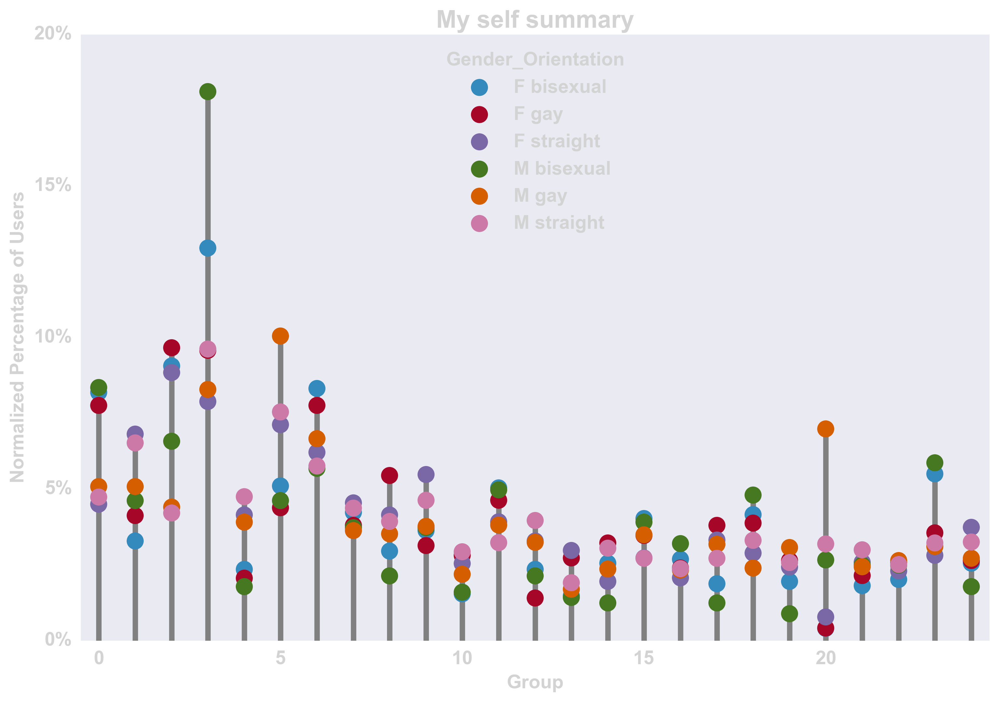

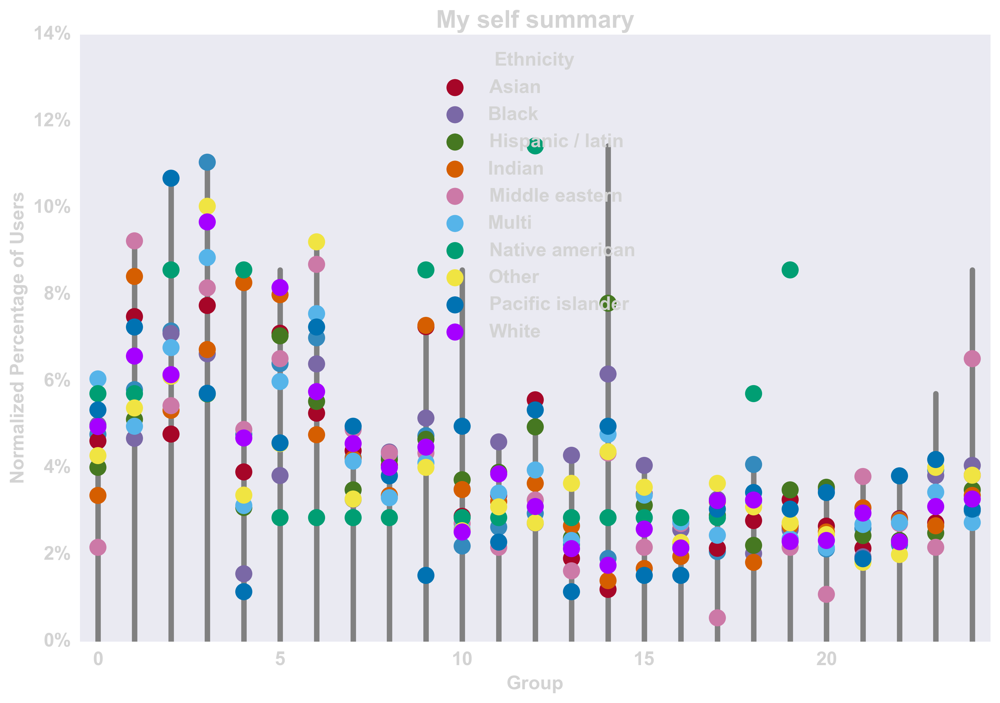

In [13]:
plot_bars(df_clean, 'essay0', ['gender_orientation', 'ethnicity'],
          ['essay0_gender_orientation.png', 'essay0_ethnicity.png'])

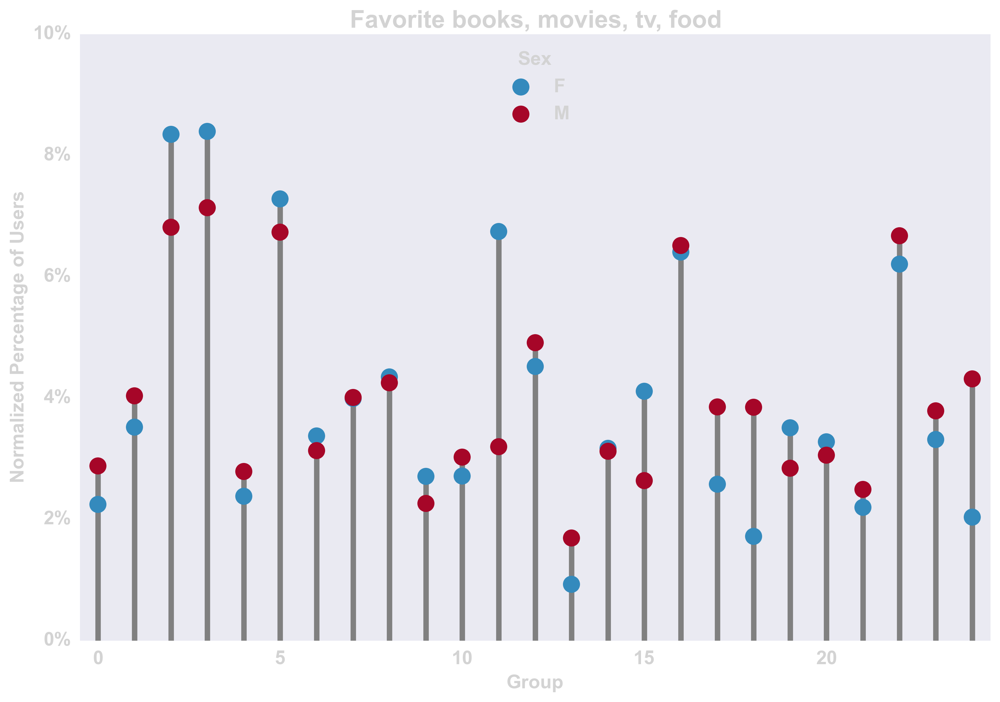

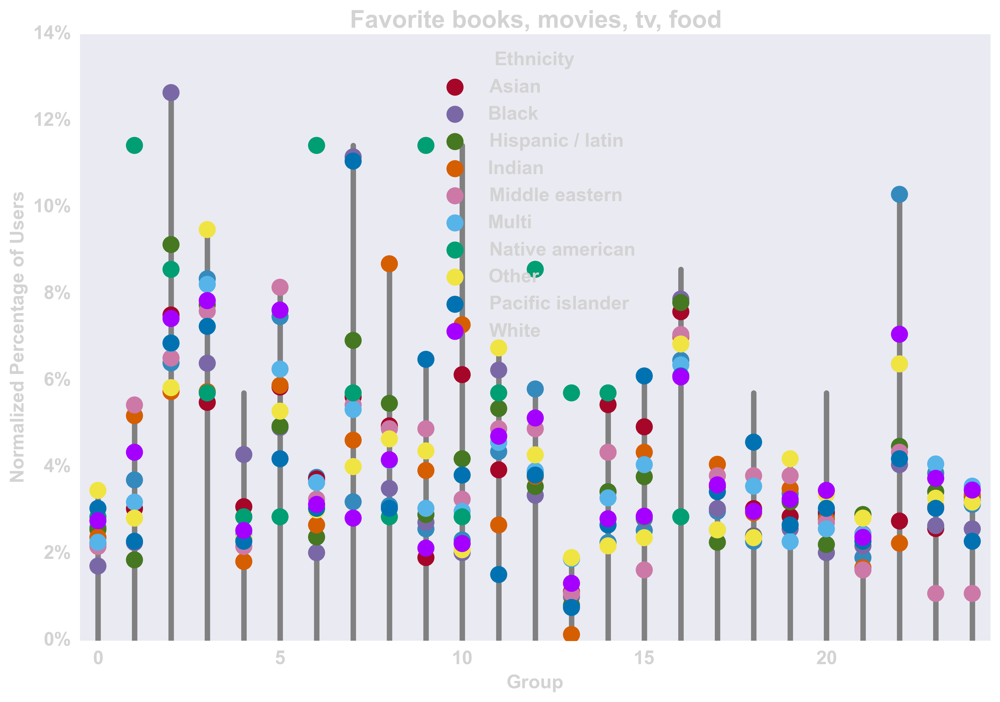

In [14]:
plot_bars(df_clean, 'essay4', ['sex', 'ethnicity'],
          ['essay4_sex.png', 'essay4_ethnicity.png'])

# Word Clouds
The code for how we visualized our word clouds is below.

## Word Cloud Color Functions

In [42]:
def gray(word, font_size, position, orientation, random_state=None, **kwargs):
    RGB = tuple([round(c * 255) for c in mpl.colors.colorConverter.to_rgb('#cccccc')])
    return 'rgb'+str(RGB)

def blue(word, font_size, position, orientation, random_state=None, **kwargs):
    RGB = tuple([round(c * 255) for c in mpl.colors.colorConverter.to_rgb('#348ABD')])
    return 'rgb'+str(RGB)

def red(word, font_size, position, orientation, random_state=None, **kwargs):
    RGB = tuple([round(c * 255) for c in mpl.colors.colorConverter.to_rgb('#A60628')])
    return 'rgb'+str(RGB)

def purple(word, font_size, position, orientation, random_state=None, **kwargs):
    RGB = tuple([round(c * 255) for c in mpl.colors.colorConverter.to_rgb('#7A68A6')])
    return 'rgb'+str(RGB)

def green(word, font_size, position, orientation, random_state=None, **kwargs):
    RGB = tuple([round(c * 255) for c in mpl.colors.colorConverter.to_rgb('#467821')])
    return 'rgb'+str(RGB)

def orange(word, font_size, position, orientation, random_state=None, **kwargs):
    RGB = tuple([round(c * 255) for c in mpl.colors.colorConverter.to_rgb('#D55E00')])
    return 'rgb'+str(RGB)

def green_orange(word, font_size, position, orientation, random_state=None, **kwargs):
    green = 'rgb'+str(tuple([round(c * 255) for c in mpl.colors.colorConverter.to_rgb('#467821')]))
    orange = 'rgb'+str(tuple([round(c * 255) for c in mpl.colors.colorConverter.to_rgb('#D55E00')]))
    if random.randint(0, 1):
        return green
    else:
        return orange
    
def red_blue(word, font_size, position, orientation, random_state=None, **kwargs):
    red = 'rgb'+str(tuple([round(c * 255) for c in mpl.colors.colorConverter.to_rgb('#A60628')]))
    blue = 'rgb'+str(tuple([round(c * 255) for c in mpl.colors.colorConverter.to_rgb('#348ABD')]))
    if random.randint(0, 1):
        return red
    else:
        return blue
    
def yellow(word, font_size, position, orientation, random_state=None, **kwargs):
    RGB = tuple([round(c * 255) for c in mpl.colors.colorConverter.to_rgb('#ffd966')])
    return 'rgb'+str(RGB)

def cyan(word, font_size, position, orientation, random_state=None, **kwargs):
    RGB = tuple([round(c * 255) for c in mpl.colors.colorConverter.to_rgb('#64ffda')])
    return 'rgb'+str(RGB)

In [16]:
#This function creates the word cloud with the specified vocabulary
def wcloud(split0, split1, vocabulary, n, color, fname):
    print(count_0.shape, count_1.shape)

    blah = pd.DataFrame({'0' : np.array(split0.sum(axis=0))[0],
                         '1' : np.array(split1.sum(axis=0))[0],
                         'vocab' : vocabulary})

    blah['0'] = blah['0'] / blah['0'].sum()
    blah['1'] = blah['1'] / blah['1'].sum()

    blah['diff'] = blah['0'] - blah['1']

    blah.sort('diff', ascending=False, inplace=True)
    blah.reset_index(drop=True, inplace=True)

    blah_top = blah[:n].copy()
    blah_top['diff'] = np.round(np.abs(blah_top['diff']) * 10000, 0)
    v = blah_top['vocab'].tolist()
    c = blah_top['diff'].tolist()
    wf = list(zip(v, c))

    wc = WordCloud(background_color=None, mode='RGBA',
                   width=2400, height=1600, relative_scaling=0.5,
                   font_path='/Library/Fonts/Futura.ttc')
    wc.generate_from_frequencies(wf)
    plt.figure()
    plt.imshow(wc.recolor(color_func=color, random_state=42))
    plt.axis("off")
    plt.savefig(fname, dpi=300, transparent=True)

## Essay 0 Word Clouds

In [32]:
df = pd.read_csv('data/profiles.20120630.csv')

essay_list = ['essay0']
df_clean = clean_up(df, essay_list)
df_clean.fillna('', inplace=True)

df_clean['religion'] = df_clean['religion'].apply(religion_categories)
df_clean['job'] = df_clean['job'].apply(job_categories)
df_clean['drugs'] = df_clean['drugs'].apply(drug_categories)
df_clean['diet'] = df_clean['diet'].apply(diet_categories)
df_clean['body_type'] = df_clean['body_type'].apply(body_categories)
df_clean['drinks'] = df_clean['drinks'].apply(drink_categories)
df_clean['sign'] = df_clean['sign'].apply(sign_categories)
df_clean['ethnicity'] = df_clean['ethnicity'].apply(ethnicity_categories)
df_clean['pets'] = df_clean['pets'].apply(pets_categories)
df_clean['speaks'] = df_clean['speaks'].apply(language_categories)
count_matrix, tfidf_matrix, vocab = col_to_data_matrix(df_clean, essay_list[0])
K = 25
df_clean['group'] = nmf_labels(tfidf_matrix, k=K)
df_clean['sex'] = df_clean['sex'].apply(lambda x: str.upper(x))
df_clean['gender_orientation'] = df_clean[['sex','orientation']].apply(lambda x: ' '.join(x), axis=1)
n=100

## Group Word Clouds
For a couple groups of interest, we visualized the words that had the largest difference in frequency between the group and the rest of the data set. We found that these words mapped perfectly to the words Non-negative Matrix Factorization generated for each group

(2990, 1021) (49966, 1021)


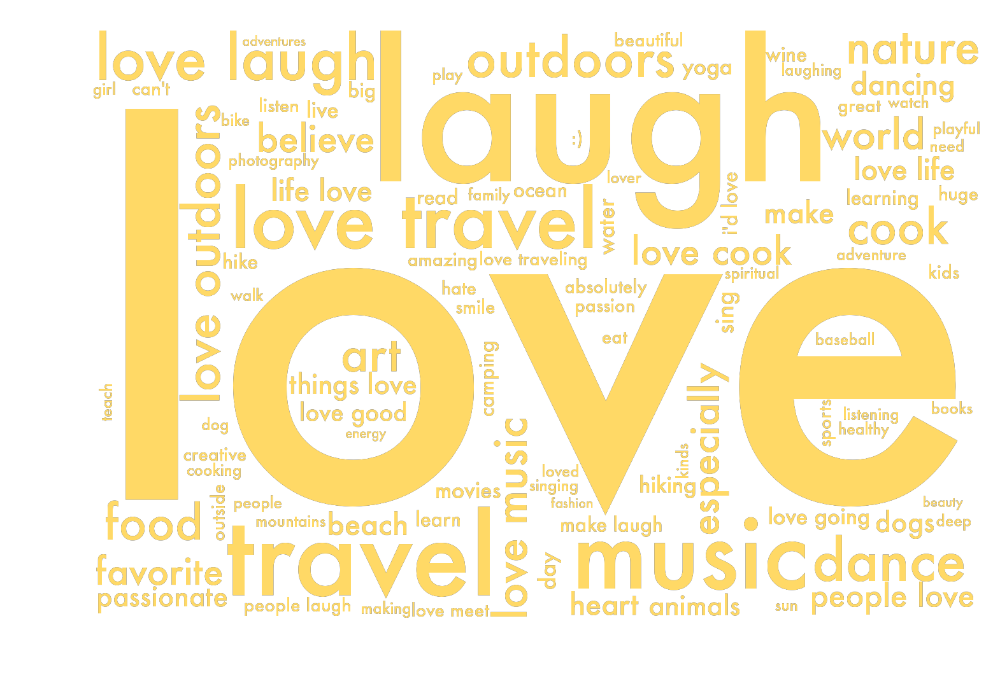

In [43]:
count_0 = count_matrix[np.array(df_clean.group==2), :]
count_1 = count_matrix[np.array(df_clean.group!=2), :]

wcloud(count_0, count_1, vocab, n, yellow, 'group2.png')

(2319, 1021) (50637, 1021)


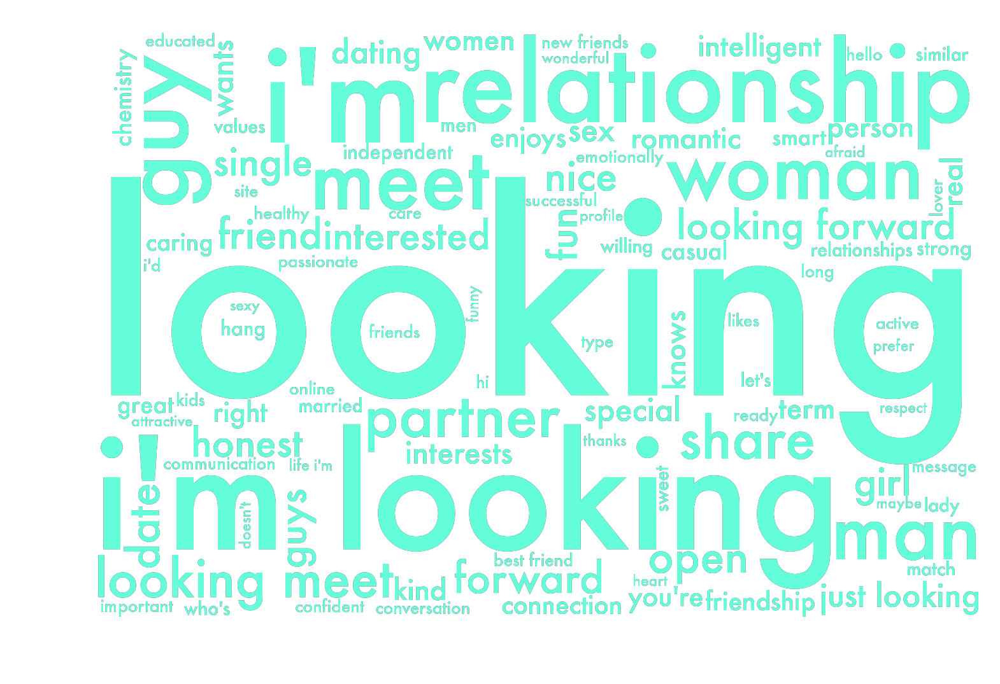

In [44]:
count_0 = count_matrix[np.array(df_clean.group==6), :]
count_1 = count_matrix[np.array(df_clean.group!=6), :]

wcloud(count_0, count_1, vocab, n, cyan, 'group6.png')

(2321, 1021) (50635, 1021)


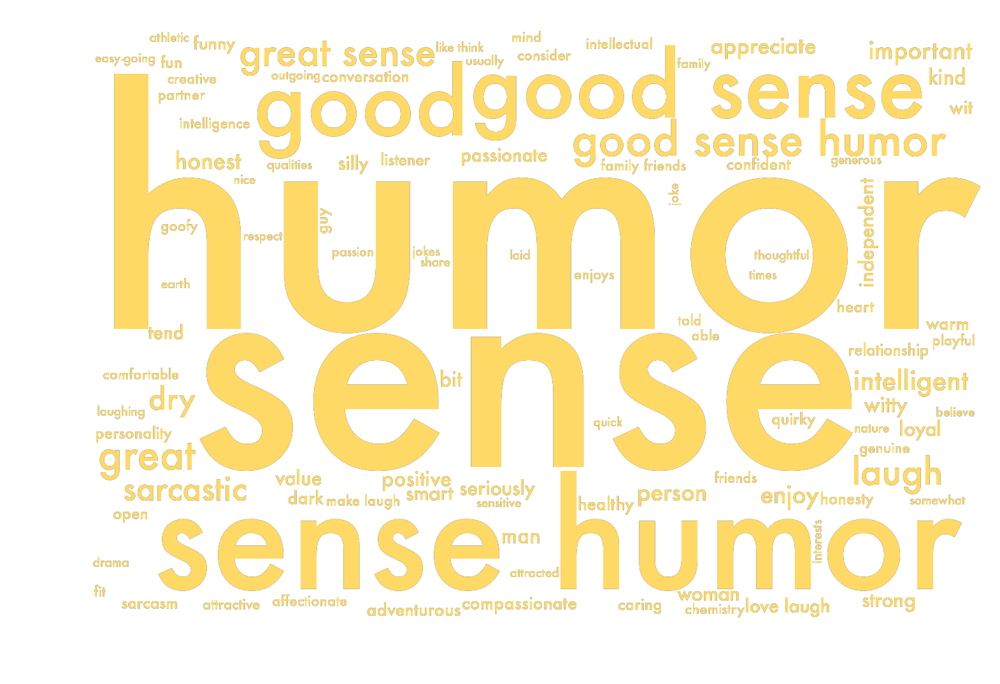

In [45]:
count_0 = count_matrix[np.array(df_clean.group==11), :]
count_1 = count_matrix[np.array(df_clean.group!=11), :]

wcloud(count_0, count_1, vocab, n, yellow, 'group11.png')

(1684, 1021) (51272, 1021)


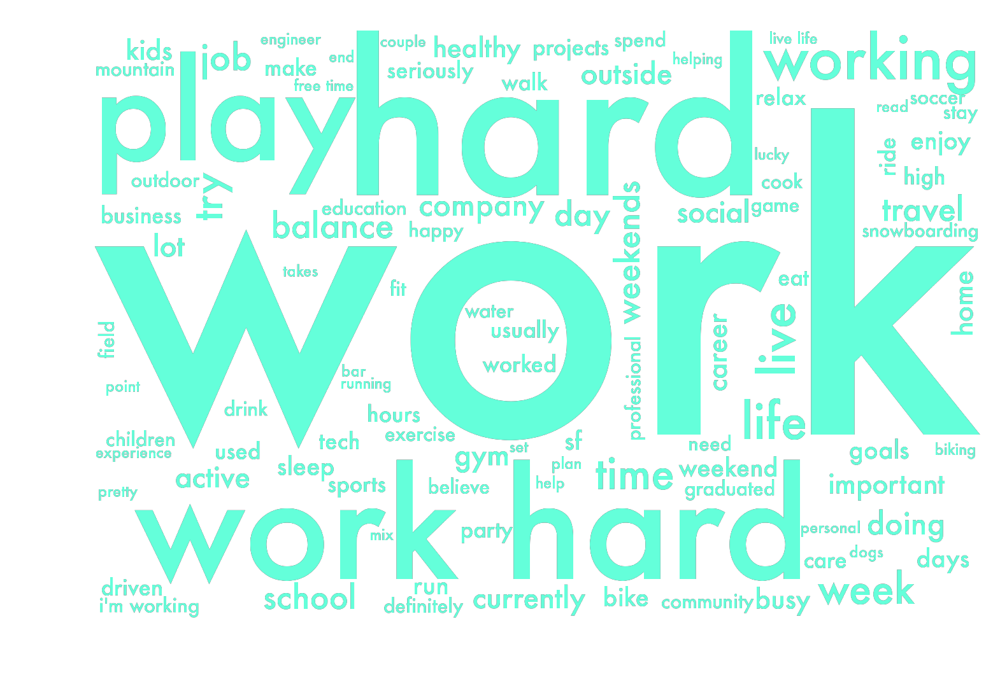

In [46]:
count_0 = count_matrix[np.array(df_clean.group==16), :]
count_1 = count_matrix[np.array(df_clean.group!=16), :]

wcloud(count_0, count_1, vocab, n, cyan, 'group16.png')

## Demographic Split Word Clouds
We visualized a few of the interesting demographic splits below. For example, since gay men dominate group 1 when we look at gender crossed with orientation and group 1 discusses location, we wanted to show what kinds of words gay men tended to use in that group.

#### Ethnicity Split

#### Asians in Group 4

(570, 1021) (36744, 1021)


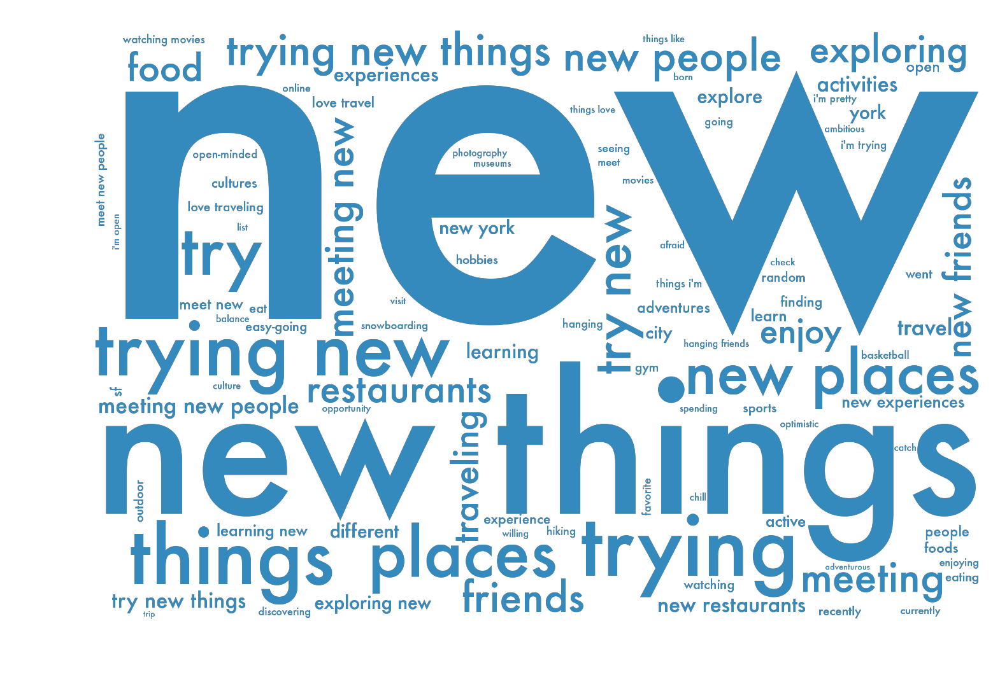

In [33]:
count_0 = count_matrix[np.array((df_clean.group==4) &
                                (df_clean.ethnicity=='asian')), :]
count_1 = count_matrix[np.array((df_clean.group!=4) &
                                (df_clean.ethnicity.isin(['black',
                                                          'hispanic / latin',
                                                          'multi',
                                                          'white']))), :]
wcloud(count_0, count_1, vocab, n, blue, 'essay0_group4_asian.png')

#### Hispanics in Group 9

(204, 1021) (41764, 1021)


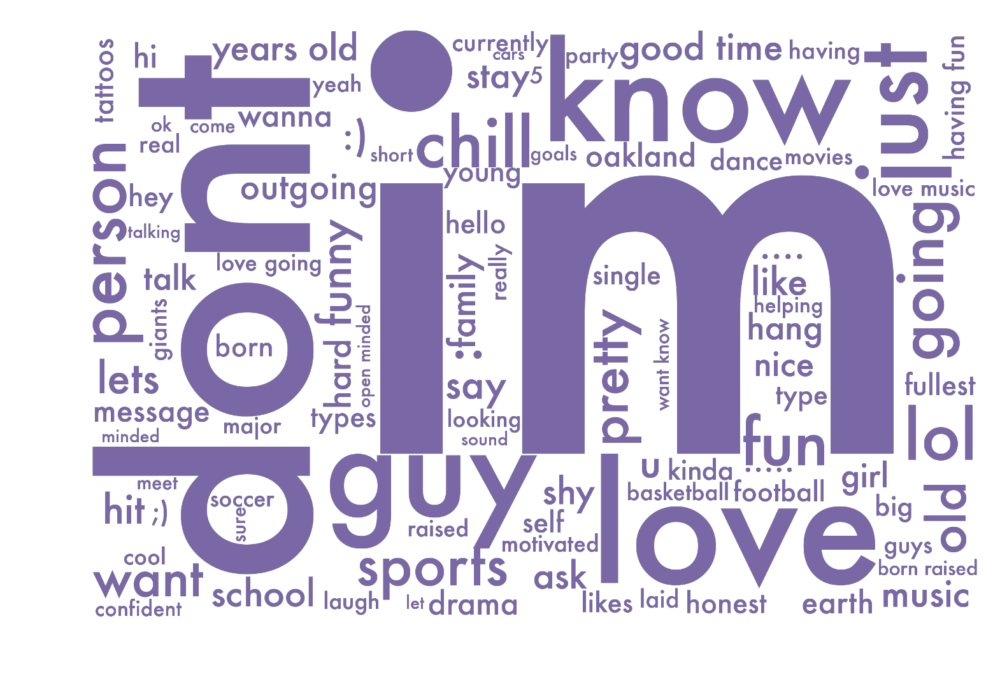

In [35]:
count_0 = count_matrix[np.array((df_clean.group==9) &
                                (df_clean.ethnicity=='hispanic / latin')), :]
count_1 = count_matrix[np.array((df_clean.group!=9) &
                                (df_clean.ethnicity.isin(['black',
                                                          'asian',
                                                          'multi',
                                                          'white']))), :]

wcloud(count_0, count_1, vocab, n, purple, 'essay0_group9_hispanic.png')

##### Gender Orientation Split

####Gay Men in Group 1

(353, 1021) (45946, 1021)


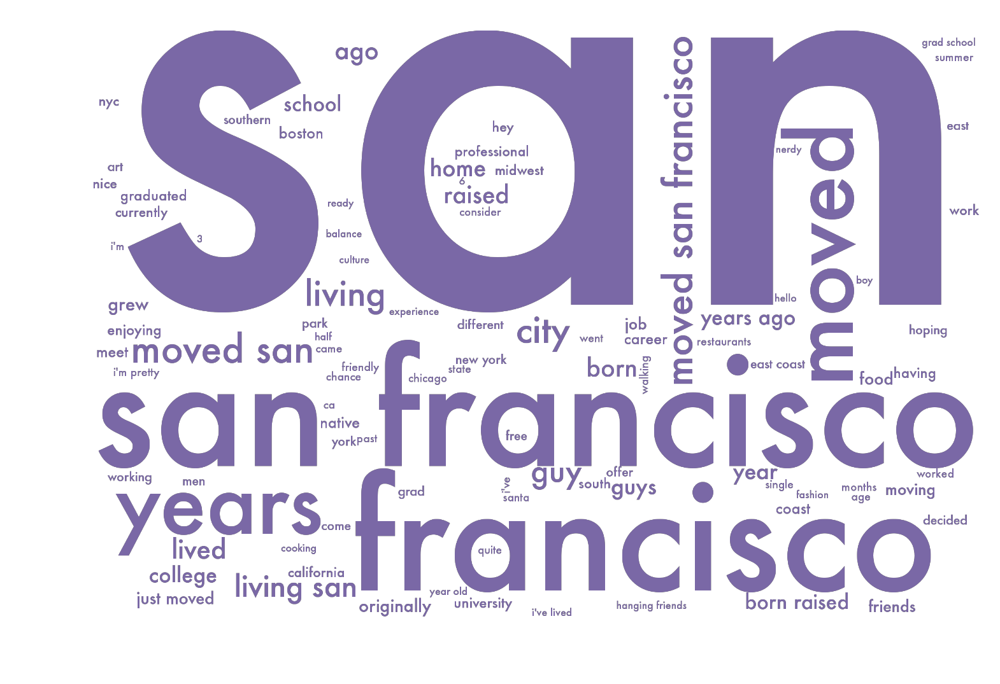

In [36]:
count_0 = count_matrix[np.array((df_clean.group==1) & (df_clean.gender_orientation=='M gay')), :]
count_1 = count_matrix[np.array((df_clean.group!=1) & (df_clean.gender_orientation!='M gay')), :]

wcloud(count_0, count_1, vocab, n, purple, 'essay0_group1_mgay.png')

#### Women in Group 2

(1692, 1021) (30337, 1021)


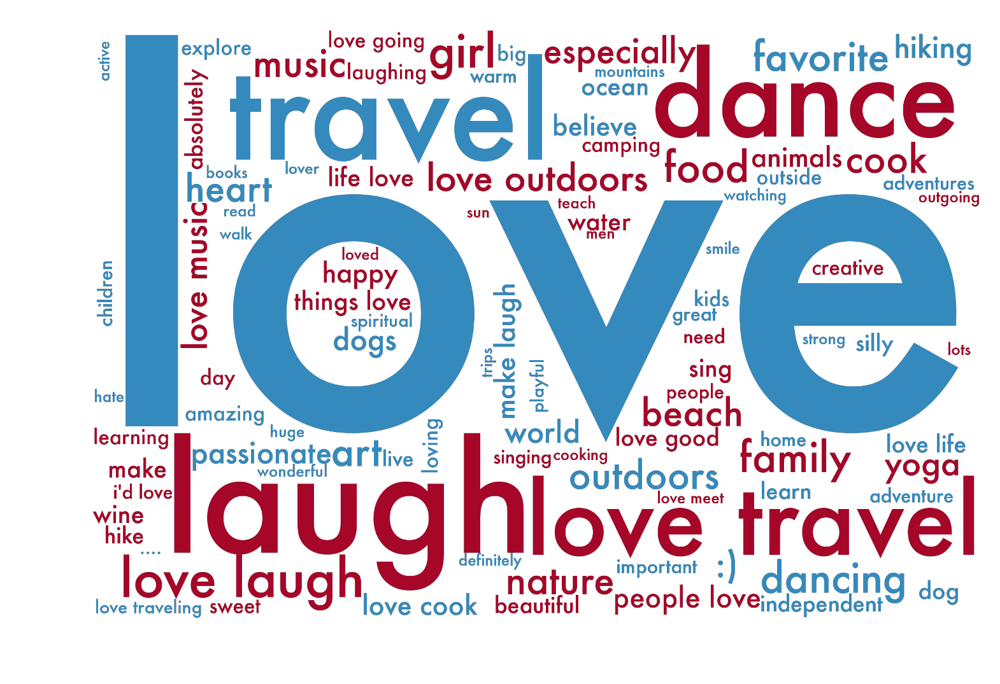

In [37]:
count_0 = count_matrix[np.array((df_clean.group==2) & (df_clean.sex=='F')), :]
count_1 = count_matrix[np.array((df_clean.group!=2) & (df_clean.sex!='F')), :]

wcloud(count_0, count_1, vocab, n, red_blue, 'essay0_group2_f.png')

####Gay Men in Group 6

(239, 1021) (47256, 1021)


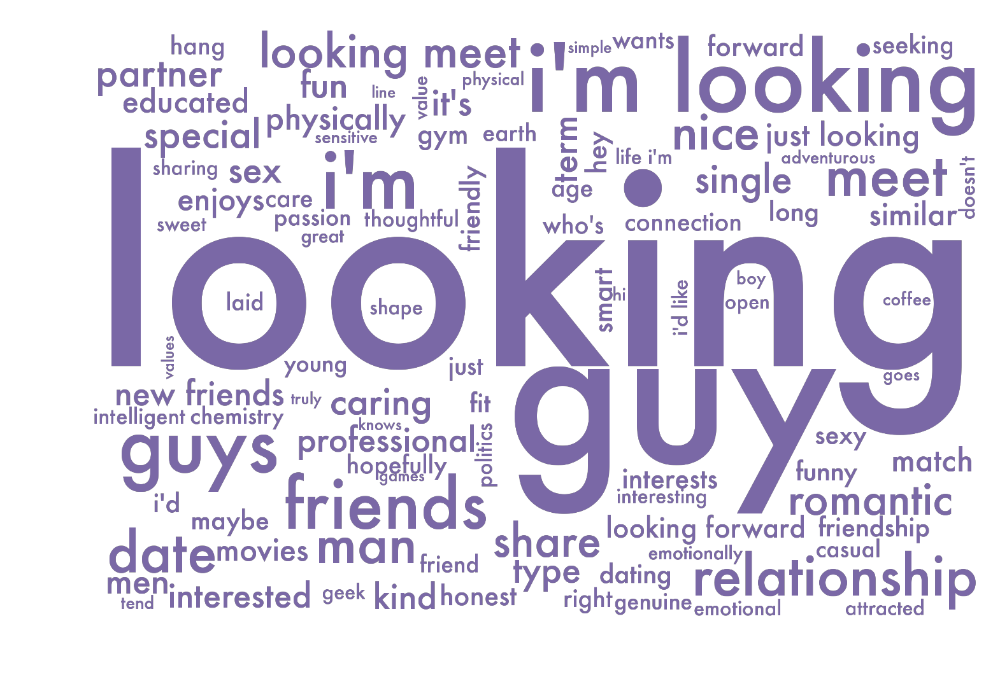

In [39]:
count_0 = count_matrix[np.array((df_clean.group==6) & (df_clean.gender_orientation=='M gay')), :]
count_1 = count_matrix[np.array((df_clean.group!=6) & (df_clean.gender_orientation!='M gay')), :]

wcloud(count_0, count_1, vocab, n, purple, 'essay0_group6_mgay.png')

#### Gay Women in Group 7

(138, 1021) (48015, 1021)


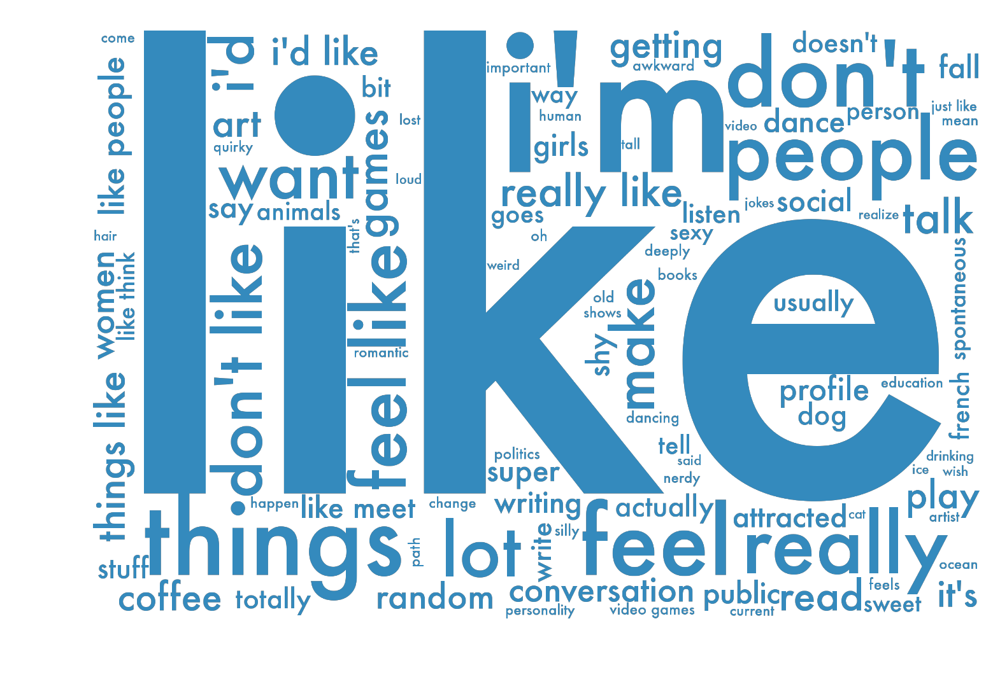

In [40]:
count_0 = count_matrix[np.array((df_clean.group==7) & (df_clean.gender_orientation=='F gay')), :]
count_1 = count_matrix[np.array((df_clean.group!=7) & (df_clean.gender_orientation!='F gay')), :]

wcloud(count_0, count_1, vocab, n, blue, 'essay0_group7_fgay.png')

## Essay 4 Word Clouds

In [47]:
df = pd.read_csv('data/profiles.20120630.csv')

essay_list = ['essay4']
df_clean = clean_up(df, essay_list)
df_clean.fillna('', inplace=True)

df_clean['religion'] = df_clean['religion'].apply(religion_categories)
df_clean['job'] = df_clean['job'].apply(job_categories)
df_clean['drugs'] = df_clean['drugs'].apply(drug_categories)
df_clean['diet'] = df_clean['diet'].apply(diet_categories)
df_clean['body_type'] = df_clean['body_type'].apply(body_categories)
df_clean['drinks'] = df_clean['drinks'].apply(drink_categories)
df_clean['sign'] = df_clean['sign'].apply(sign_categories)
df_clean['ethnicity'] = df_clean['ethnicity'].apply(ethnicity_categories)
df_clean['pets'] = df_clean['pets'].apply(pets_categories)
df_clean['speaks'] = df_clean['speaks'].apply(language_categories)
count_matrix, tfidf_matrix, vocab = col_to_data_matrix(df_clean, essay_list[0])
K = 25
df_clean['group'] = nmf_labels(tfidf_matrix, k=K)
df_clean['sex'] = df_clean['sex'].apply(lambda x: str.upper(x))
df_clean['gender_orientation'] = df_clean[['sex','orientation']].apply(lambda x: ' '.join(x), axis=1)
n=100

## Group Word Clouds

(2314, 1396) (45791, 1396)


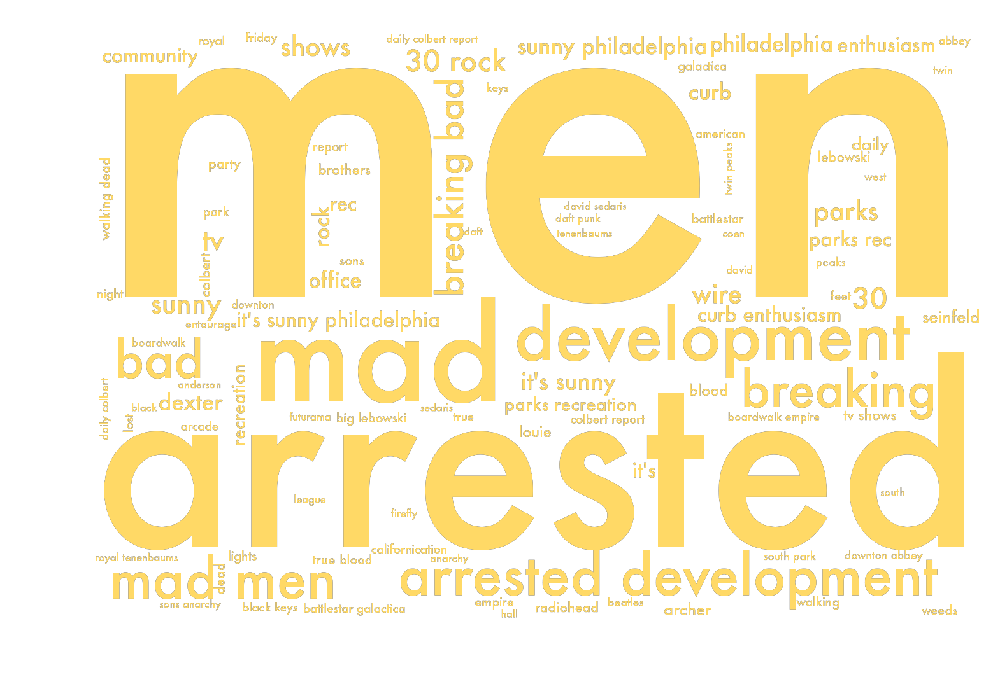

In [48]:
count_0 = count_matrix[np.array(df_clean.group==1), :]
count_1 = count_matrix[np.array(df_clean.group!=1), :]

wcloud(count_0, count_1, vocab, n, yellow, 'group1.png')

(2846, 1396) (45259, 1396)


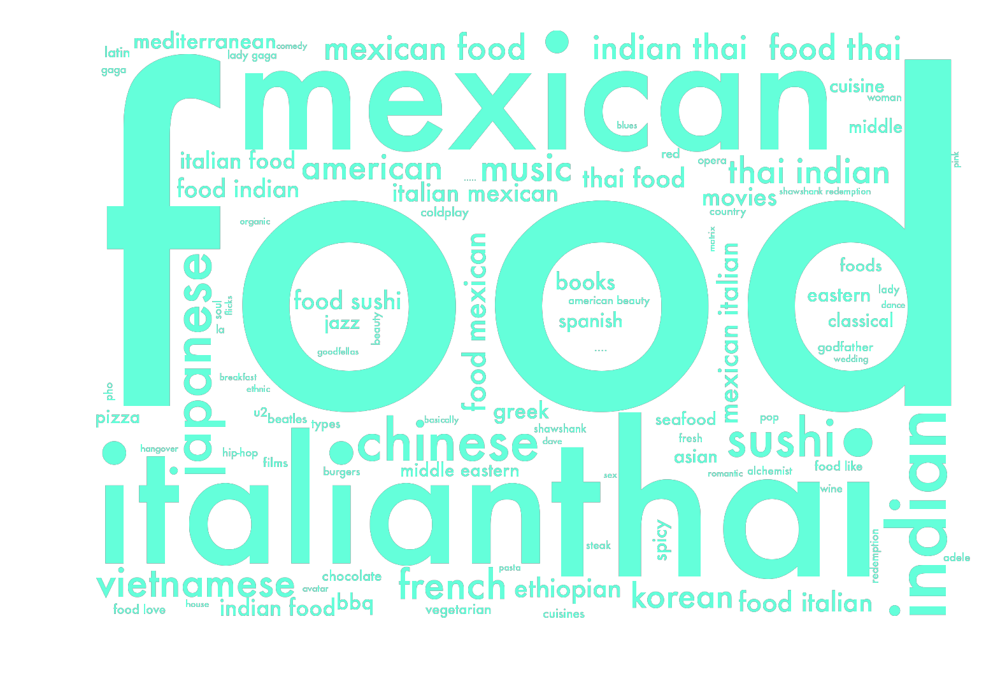

In [49]:
count_0 = count_matrix[np.array(df_clean.group==8), :]
count_1 = count_matrix[np.array(df_clean.group!=8), :]

wcloud(count_0, count_1, vocab, n, cyan, 'group8.png')

(1702, 1396) (46403, 1396)


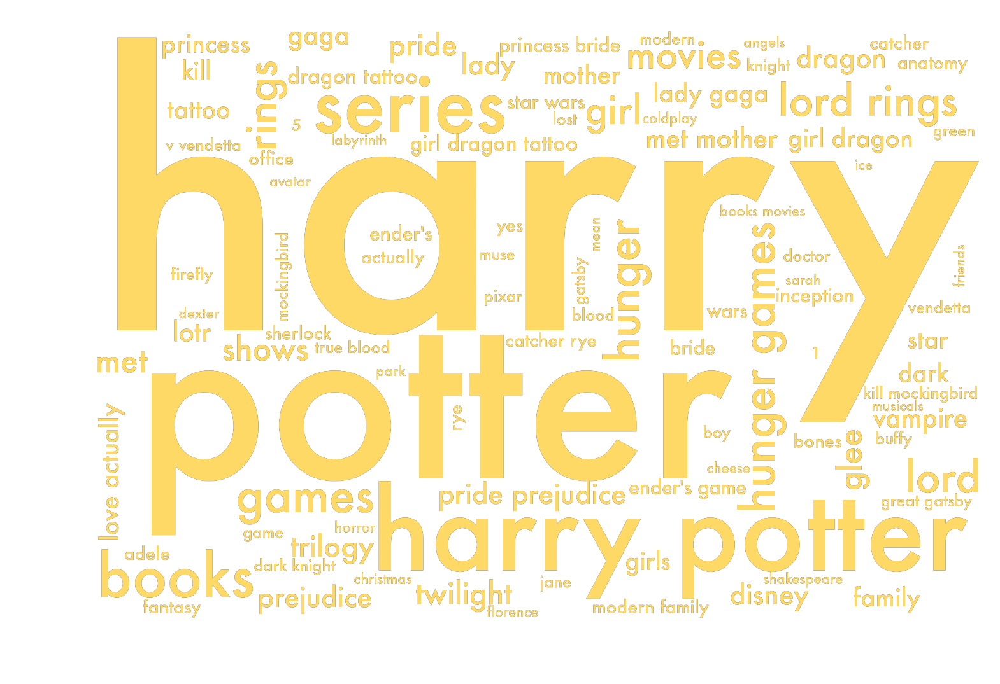

In [50]:
count_0 = count_matrix[np.array(df_clean.group==15), :]
count_1 = count_matrix[np.array(df_clean.group!=15), :]

wcloud(count_0, count_1, vocab, n, yellow, 'group15.png')

(3785, 1396) (44320, 1396)


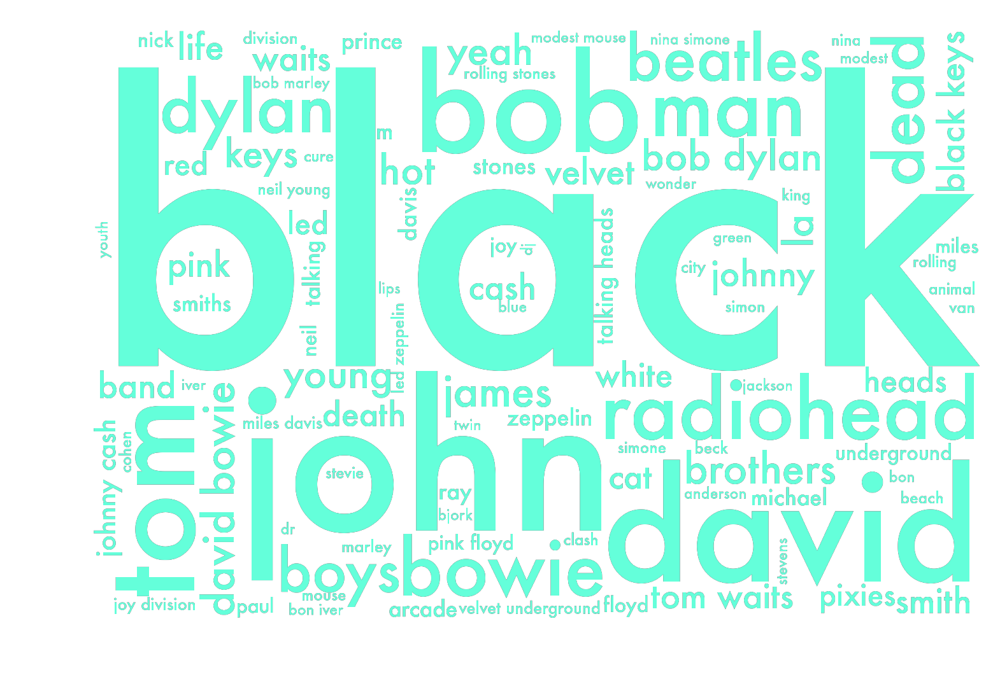

In [51]:
count_0 = count_matrix[np.array(df_clean.group==22), :]
count_1 = count_matrix[np.array(df_clean.group!=22), :]

wcloud(count_0, count_1, vocab, n, cyan, 'group22.png')

##Demographic Split Word Clouds

####African Americans in Group 7

(189, 1396) (38436, 1396)


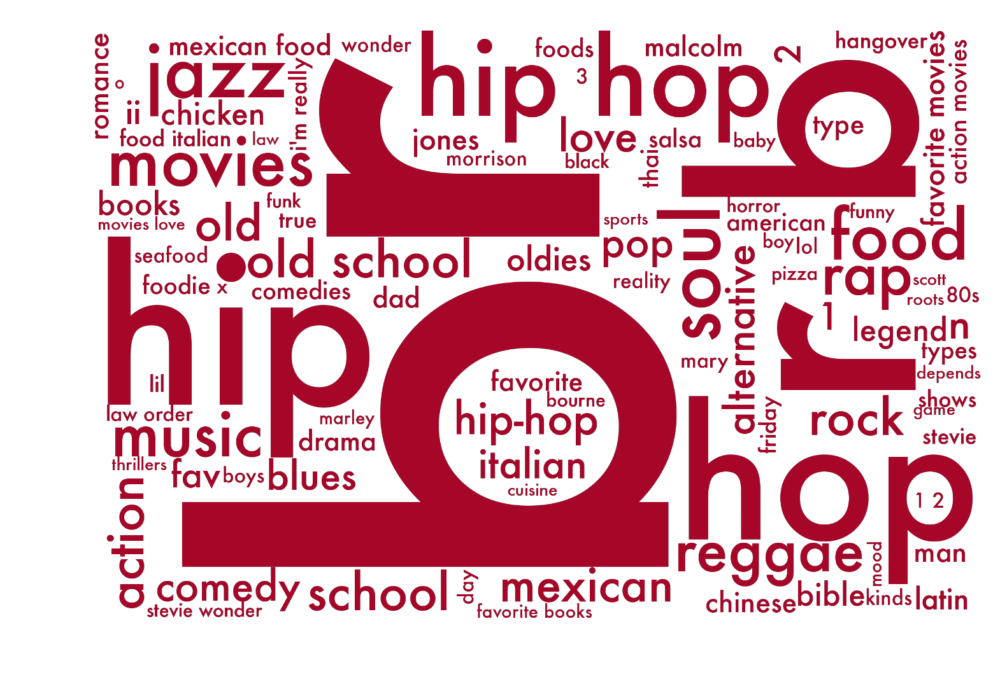

In [52]:
count_0 = count_matrix[np.array((df_clean.group==7) &
                                (df_clean.ethnicity=='black')), :]
count_1 = count_matrix[np.array((df_clean.group!=7) &
                                (df_clean.ethnicity.isin(['asian',
                                                          'hispanic / latin',
                                                          'multi',
                                                          'white']))), :]

wcloud(count_0, count_1, vocab, n, red, 'essay4_group7_black.png')

####White/Multi people in Group 22

(2783, 1396) (7994, 1396)


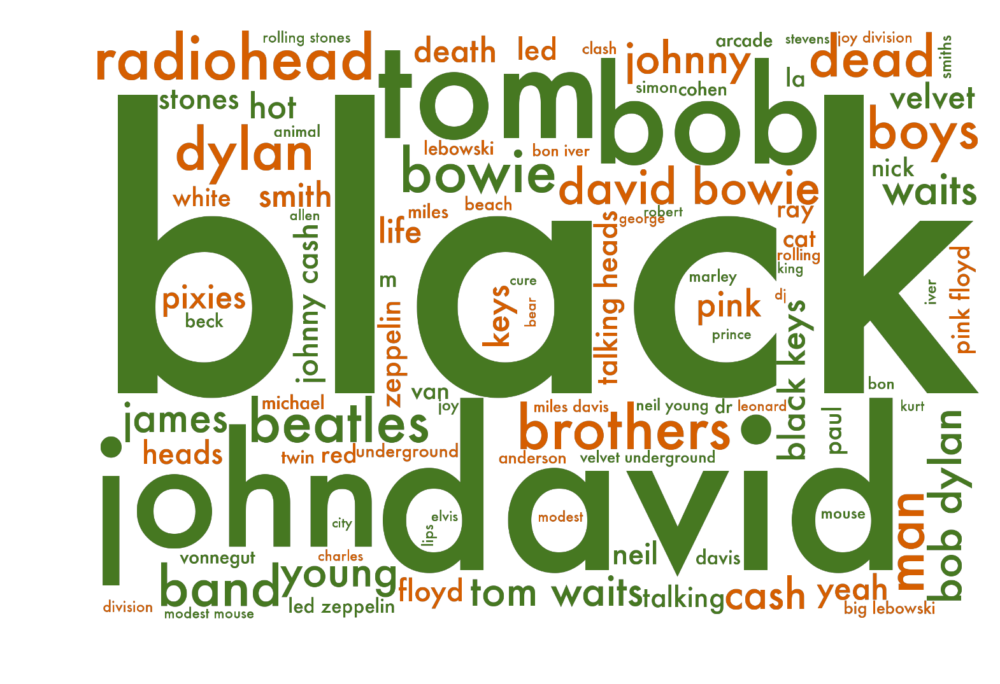

In [53]:
count_0 = count_matrix[np.array((df_clean.group==22) &
                                (df_clean.ethnicity.isin(['white',
                                                          'multi']))), :]
count_1 = count_matrix[np.array((df_clean.group!=22) &
                                (df_clean.ethnicity.isin(['asian',
                                                          'black',
                                                          'hispanic / latin']))), :]

wcloud(count_0, count_1, vocab, n, green_orange, 'essay4_group22_whitemulti.png')

####Asians in Group 12

(272, 1396) (42317, 1396)


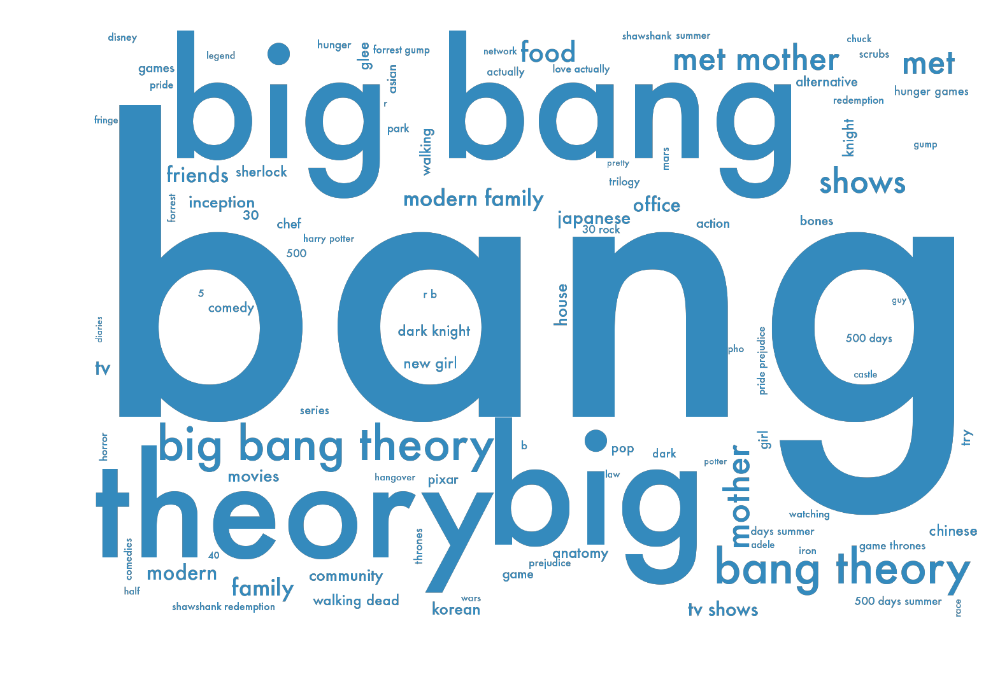

In [54]:
count_0 = count_matrix[np.array((df_clean.group==12) & (df_clean.ethnicity=='asian')), :]
count_1 = count_matrix[np.array((df_clean.group!=12) & (df_clean.ethnicity!='asian')), :]

wcloud(count_0, count_1, vocab, n, blue, 'essay4_group12_asian.png')

####White people in Group 1

(1505, 1396) (20054, 1396)


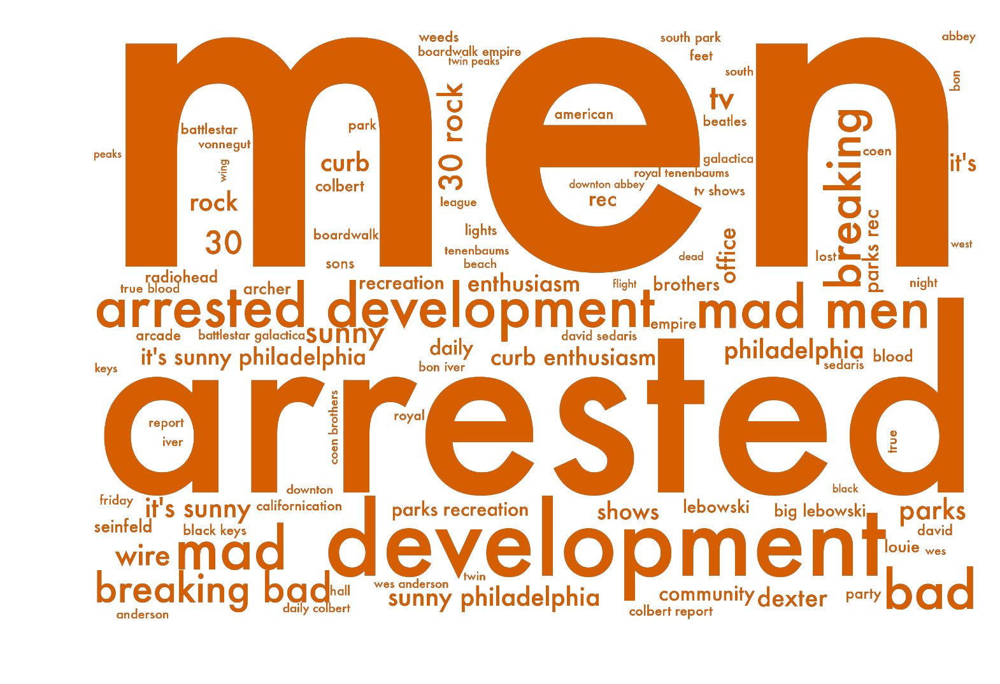

In [55]:
count_0 = count_matrix[np.array((df_clean.group==1) & (df_clean.ethnicity=='white')), :]
count_1 = count_matrix[np.array((df_clean.group!=1) & (df_clean.ethnicity!='white')), :]

wcloud(count_0, count_1, vocab, n, orange, 'essay4_group1_white.png')

####Women in Groups 2, 15, and 24

(1812, 1396) (4669, 1396)


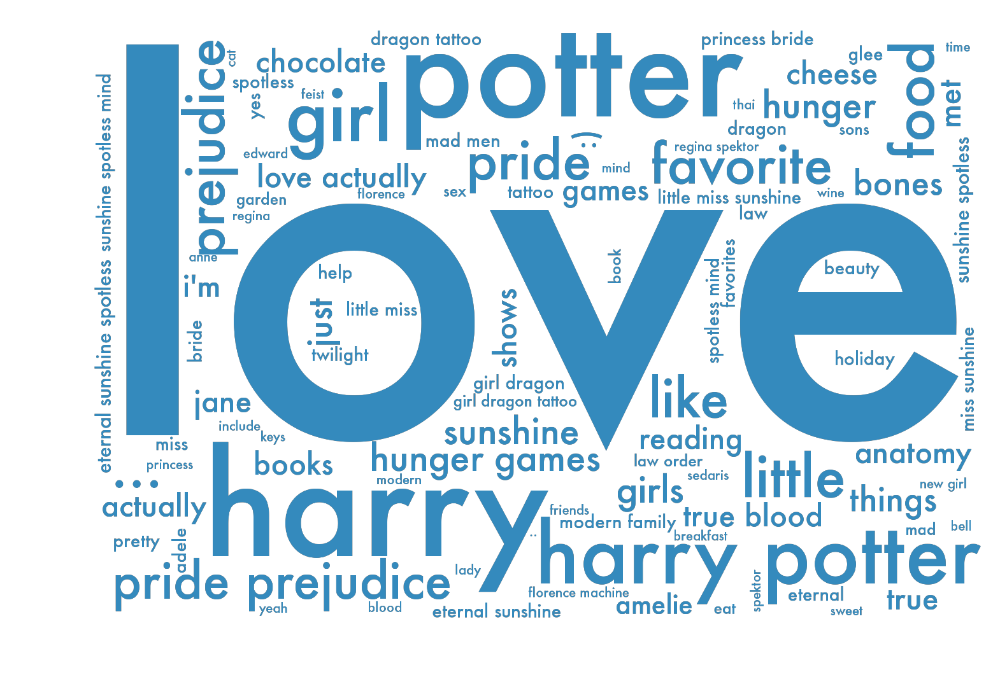

In [57]:
count_0 = count_matrix[np.array((df_clean.group.isin([2, 15, 24])) & (df_clean.sex=='F')), :]
count_1 = count_matrix[np.array((df_clean.group.isin([2, 15, 24])) & (df_clean.ethnicity!='F')), :]

wcloud(count_0, count_1, vocab, n, blue, 'essay4_movies_women.png')

####Men in Groups 2, 15, 24

(2857, 1396) (4669, 1396)


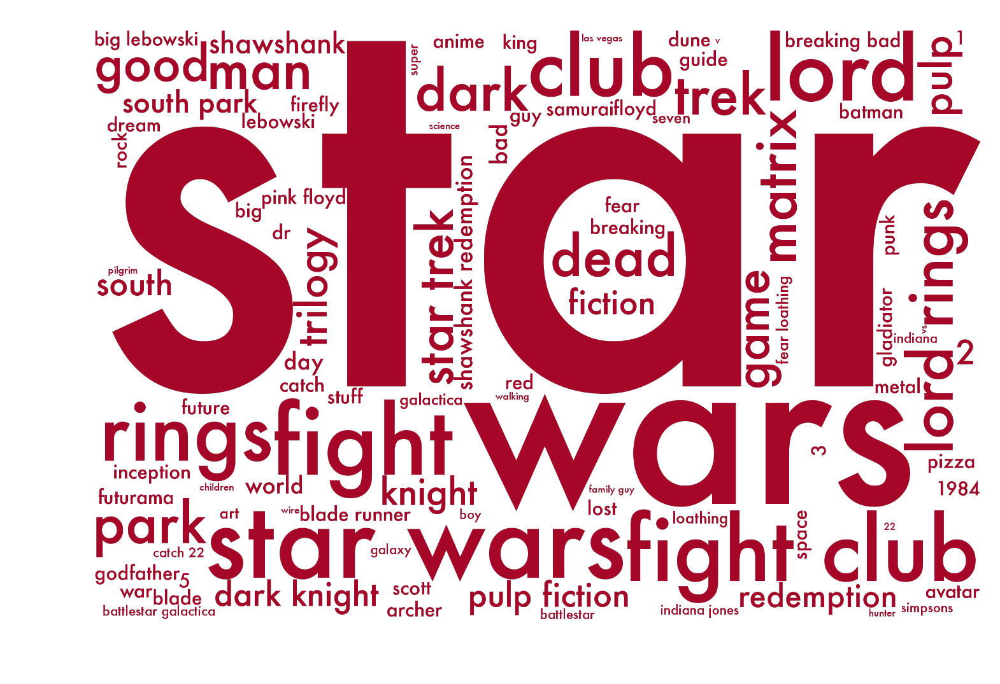

In [59]:
count_0 = count_matrix[np.array((df_clean.group.isin([2, 15, 24])) & (df_clean.sex=='M')), :]
count_1 = count_matrix[np.array((df_clean.group.isin([2, 15, 24])) & (df_clean.ethnicity!='M')), :]

wcloud(count_0, count_1, vocab, n, red, 'essay4_movies_men.png')